In [4]:
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

In [5]:
#load data from transalted json and switch the transalted-Content as 'website_text'
df = pd.read_json('../../data/preprocessed/translated_results_en.json')

# Display the modified DataFrame
df

,name,original_idx,website_url,website_text,original_language,website_text_in_en
0,itravel,0,https://www.itravel.de/,itravel Telefonische Beratung +49 221 8282 888...,de,itravel Telephone advice +49 221 8282 8880 | S...
1,kunveno,2,https://kunveno.de,Kunveno - Work Happier WORK HAPPIER Booste Unt...,de,Kunveno - Work Happier WORK HAPPIER Boost cult...
3,Scopas,4,https://www.scopas.io/,ScopasWe're working on something new.Check it ...,en,ScopasWe're working on something new.Check it ...
4,studymaniac,5,https://studymaniac.de,Studymaniac - erfolgreich Studieren Open main ...,de,Studymaniac - study successfully Open main men...
6,Aicone,9,http://www.ai-c.one,Aicone - Artificial Intelligence Cloud One | A...,en,Aicone - Artificial Intelligence Cloud One | A...
...,...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,Coleap Transform your content into incomeTurn ...,en,Coleap Transform your content into incomeTurn ...
3285,Trade Machines FI,4995,http://trademachines.com,▷ All used industrial equipment online on Trad...,en,▷ All used industrial equipment online on Trad...
3286,Yasoon,4996,http://yasoon.com/,Home - yasoon Patrick Partner Manager Get in t...,en,Home - yasoon Patrick Partner Manager Get in t...
3287,Phoneboost,4997,https://www.phoneboost.de/,Phoneboost – Boost up your phone! AKKU LEER?PH...,de,Phoneboost – Boost up your phone! BATTERY EMPT...


In [6]:
# import packages
import re

# import pandas as pd
# import numpy as np

# import matplotlib.pyplot as plt
# import seaborn as sns

import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
nltk.download('stopwords')


from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import GaussianNB

# from skmultilearn.problem_transform import BinaryRelevance

[nltk_data] Downloading package stopwords to /Users/kathi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
# define functions

def cleanPunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]', r'', sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]', r' ', cleaned)
    cleaned = re.sub(r'[äÄ]', 'ä', cleaned)
    cleaned = re.sub(r'[öÖ]', 'ö', cleaned)
    cleaned = re.sub(r'[üÜ]', 'ü', cleaned)
    cleaned = cleaned.strip()
    return cleaned

def keepAlpha(sentence):
    alpha_sent = ""
    for word in sentence.split():
        alpha_word = re.sub('[^a-zA-ZäöüÄÖÜß]+', ' ', word, flags=re.UNICODE)
        alpha_sent += alpha_word
        alpha_sent += " "
    alpha_sent = alpha_sent.strip()
    return alpha_sent

def removeStopWords(sentence, stopwords):
    re_stop_words = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)   
    return re_stop_words.sub(" ", sentence)

def stemming(sentence):
    stemSentence = ""
    for word in sentence.split():
        stem = stemmer.stem(word)
        stemSentence += stem
        stemSentence += " "
    stemSentence = stemSentence.strip()
    return stemSentence

# define stopwords
stop_words = set(stopwords.words(['english']))

# define stemmer
stemmer = SnowballStemmer('english')

df['website_text'] = df['website_text'].astype(str)
# apply functions
df['website_text'] = df['website_text'].str.lower()
df['website_text'] = df['website_text'].apply(cleanPunc)
df['website_text'] = df['website_text'].apply(keepAlpha)
df['website_text'] = df['website_text'].apply(removeStopWords, stopwords=stopwords)
df['website_text'] = df['website_text'].apply(stemming)

In [8]:
df

,name,original_idx,website_url,website_text,original_language,website_text_in_en
0,itravel,0,https://www.itravel.de/,itravel telefonisch beratung schweiz rückruf v...,de,itravel Telephone advice +49 221 8282 8880 | S...
1,kunveno,2,https://kunveno.de,kunveno work happier work happier boost untern...,de,Kunveno - Work Happier WORK HAPPIER Boost cult...
3,Scopas,4,https://www.scopas.io/,scopaswer work someth new check here,en,ScopasWe're working on something new.Check it ...
4,studymaniac,5,https://studymaniac.de,studymaniac erfolgreich studieren open main me...,de,Studymaniac - study successfully Open main men...
6,Aicone,9,http://www.ai-c.one,aicon artifici intellig cloud one advanc analy...,en,Aicone - Artificial Intelligence Cloud One | A...
...,...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,coleap transform content incometurn content in...,en,Coleap Transform your content into incomeTurn ...
3285,Trade Machines FI,4995,http://trademachines.com,use industri equip onlin trademachinesenglishu...,en,▷ All used industrial equipment online on Trad...
3286,Yasoon,4996,http://yasoon.com/,home yasoon patrick partner manag get touch mi...,en,Home - yasoon Patrick Partner Manager Get in t...
3287,Phoneboost,4997,https://www.phoneboost.de/,phoneboost boost phone akku leerphoneboostvoll...,de,Phoneboost – Boost up your phone! BATTERY EMPT...


In [9]:
# Erstelle den TF-IDF-Vektorizer
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df['website_text'])

In [10]:
# Führe das Hierarchische Clustering durch
num_clusters = 24  # Anzahl der Cluster
clustering = AgglomerativeClustering(n_clusters=num_clusters)
clustering.fit(tfidf_matrix.toarray())
cluster_labels = clustering.labels_

In [11]:
df['Cluster'] = cluster_labels
df

,name,original_idx,website_url,website_text,original_language,website_text_in_en,Cluster
0,itravel,0,https://www.itravel.de/,itravel telefonisch beratung schweiz rückruf v...,de,itravel Telephone advice +49 221 8282 8880 | S...,4
1,kunveno,2,https://kunveno.de,kunveno work happier work happier boost untern...,de,Kunveno - Work Happier WORK HAPPIER Boost cult...,7
3,Scopas,4,https://www.scopas.io/,scopaswer work someth new check here,en,ScopasWe're working on something new.Check it ...,0
4,studymaniac,5,https://studymaniac.de,studymaniac erfolgreich studieren open main me...,de,Studymaniac - study successfully Open main men...,12
6,Aicone,9,http://www.ai-c.one,aicon artifici intellig cloud one advanc analy...,en,Aicone - Artificial Intelligence Cloud One | A...,23
...,...,...,...,...,...,...,...
3284,Coleap,4994,https://coleap.com/,coleap transform content incometurn content in...,en,Coleap Transform your content into incomeTurn ...,6
3285,Trade Machines FI,4995,http://trademachines.com,use industri equip onlin trademachinesenglishu...,en,▷ All used industrial equipment online on Trad...,6
3286,Yasoon,4996,http://yasoon.com/,home yasoon patrick partner manag get touch mi...,en,Home - yasoon Patrick Partner Manager Get in t...,6
3287,Phoneboost,4997,https://www.phoneboost.de/,phoneboost boost phone akku leerphoneboostvoll...,de,Phoneboost – Boost up your phone! BATTERY EMPT...,7


---------------------------------------------Cluster 0:---------------------------------------------
ScopasWe're working on something new.Check it out here:

LuxFlux – Metrology meets Computer Vision Search for: Search for: #Hyperspectral High-performance software for industry and RandD Metrology meets Computer Vision #DigitalTwin Semiconductor solutions Get the free demo software! Current use cases LuxFlux is proud of its comprehensive metrology portfolio for perovskites. The metrology is already used in RandD and industrial environments. Please contact […] LuxFlux has developed a technology to measure tiny dimensions. Attached a sample measurement of a metal workpiece with turning grooves and laser […] LuxFlux has developed a technology to visualize a wide variety of material properties. For example, differences in structure and color can be […] News LuxFlux will again participate in the VISION trade show in Stuttgart. We are looking forward to welcoming you at our booth! Luxflux CEO

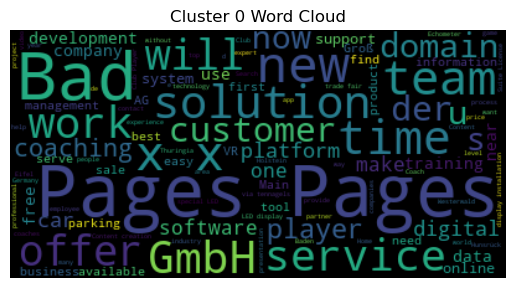

---------------------------------------------Cluster 1:---------------------------------------------
Book Taxis and Limousines Online - Talixo EN Talixo for Corporates #1 choice of Fortune 500 companies. Book on web, mobile, OBEs in 95 countries. Talixo for SMEs Take control of transfer expenses. Online payments and invoices worldwide. For Travel Agencies Book and manage trips everywhere in the world, including China and India. APIs and Integrations Book taxi and limousine transfers, track updates and commissions. Do you own a fleet? Use our Fleet Management tool for your business and receive bookings from Talixo. Book your taxi or limousine Where and When Choose a Car Details and Payment Please provide a street address, airport name or hotel name. Pick up: Our system didn't recognise the address. Please make sure it's correct - it can be a street address, airport, hotel name or venue. Estimated arrival time of the next Taxi to this address: minutes Sorry, currently no Taxi available f

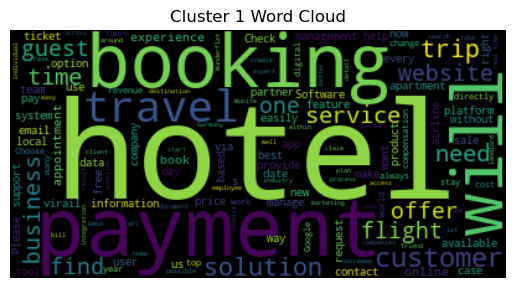

---------------------------------------------Cluster 2:---------------------------------------------
MAGNOTHERM Next generation cooling zero GWP no toxicity no explosivity MAGNOTHERM builds highly efficient and sustainable cooling systems based on magnetocaloric materials. Instead of climate-damaging or hazardous refrigerant gases, it uses a temperature-active metal in combination with water. Applications SUPERMARKET REFRIGERATION LIQUIFIED HYDROGEN POLARIS POLARIS, our revolutionary beverage magnetic cooler, is an efficient and sustainable cooling system based on magnetocaloric technology, offering energy savings and reduced emissions without traditional refrigerants or compressors. Benefits HIGHLY EFFICIENT F-GAS FREE 100% GREEN TECHNOLOGY NEARLY NOISE FREE EFFICIENT SCALING ALSO HEAT PUMP Supported by News Arbereshe Arifi 5 Jun 2023 • 2 min read Arbereshe Arifi 25 May 2023 • 1 min read Arbereshe Arifi 24 May 2023 • 1 min read Arbereshe Arifi 17 May 2023 • 1 min read Arbereshe Arifi 

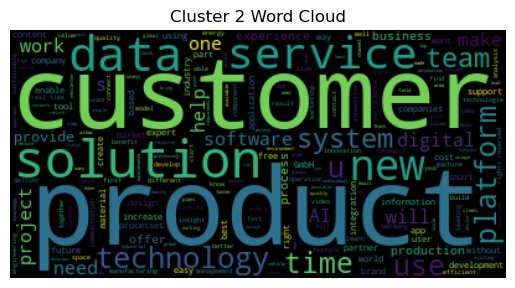

---------------------------------------------Cluster 3:---------------------------------------------
Start - Cuculus GmbH Dein Browser unterstützt leider nicht alle Funktionen dieser Website. Bitte aktualisiere ihn auf eine neuere Version oder hol’ dir einen modernen Browser. Ignorieren Affordable energy and water for everyone Jointly with our partner network, we provide software solutions to address utility challenges now and in the future. scroll Affordable energy and water for everyone Jointly with our partner network, we provide software solutions to address utility challenges now and in the future. Our vision – Affordable energy and water for everyone Cuculus is the key to providing utilities to all, while protecting the world’s precious resources. We provide cutting-edge software and technology solutions that address utility challenges worldwide. We need your help Tailoring the Cuculus experience to you We’ve developed this website just for you — but we want to improve it! Much l

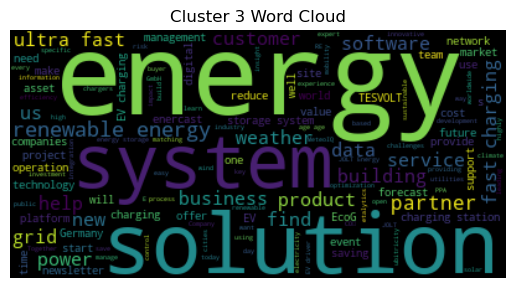

---------------------------------------------Cluster 4:---------------------------------------------
itravel Telephone advice +49 221 8282 8880 | Switzerland +41 43 588 23 34 | Arrange a callback | | EN / Experiences Highlights Travel topics Destinations Service Put together your individual dream trip now or call us on +49 221 8282 8880 SAILING TRIPS WORLDWIDE CAST OFF! Inspiration Discover longing destinations, special accommodation and exciting experiences :58 3:41 4:07 4:06 3:59 Recommendations for planning your trip Sustainability Sustainability is important to us: itravel supports a large number of organizations and projects to protect our planet and to preserve biodiversity and cultural riches. With our partnerships, we take responsibility for making our customers' trips and our business activities environmentally friendly, socially and ethically correct. ClimatePartner We fully offset the emissions from our business activities through climate protection projects. ClimatePartner 

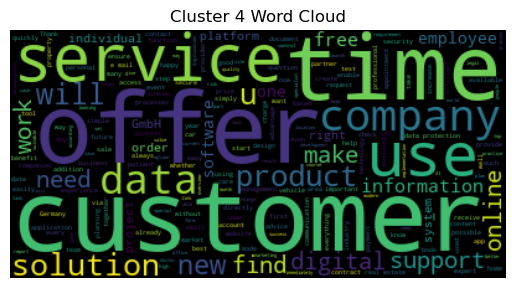

---------------------------------------------Cluster 5:---------------------------------------------
Home – Bosetein We ensure the safety of your foodOur real-time bacterial inspection technology is revolutionizing the food inspectionWhat we dowe enable our customers to measure the quality and quantify the safety of the meat products in real-time and in a non-invasive way.our services Measure hygiene ReBIS enables measurement of hygienic condition of meat products in real-time. So no more waiting for days to know the test results. quantify freshness Our non-invasive and unique technology allows to quantify the freshness of food items anywhere in the food supply chain. Predict shelf-life Measure the ‘True shelf-life’ of the products along the supply chain for better management of the stock and reducing food waste.Real-time bacterial inspection sensor can solve the problem of food loss and wasteRandDTogether with research institutes and universities we are developing stand alone and hand

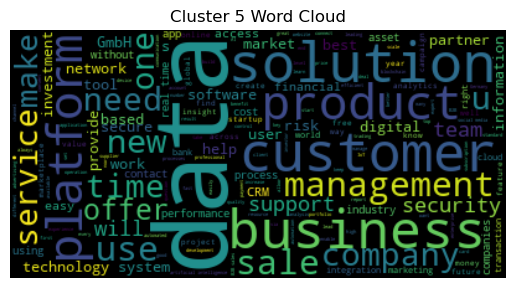

---------------------------------------------Cluster 6:---------------------------------------------
TeraSpinTec GmbH - Home of Spintronic Terahertz Sources Your Key to Ultrabroadband Terahertz Spectroscopy Home of the Spintronic Terahertz Emitter Spin it right. Let our innovative spintronic terahertz emitterunlock the full potential of your terahertz lab. Features Up to 40 THz bandwidth without any spectral gaps. From mid infrared up to X-rays: Use any pump wavelength and pump polarization you like. Fully passive THz emitter equipped with integrated magnets that allow a full THz polarization control. Generate THz electric fields reaching 100s of kV/cm. Long Term Stability Rely on a stable performance over time. Minimally invasive implementation into your setup. The THz beam characterisitcs are inherited from the pump beam. The T-Spin at Work Prototype spintronic terahertz emitter demonstrating the working principle. Note that the comes with a fully integrated magnet design. Ultrabroad

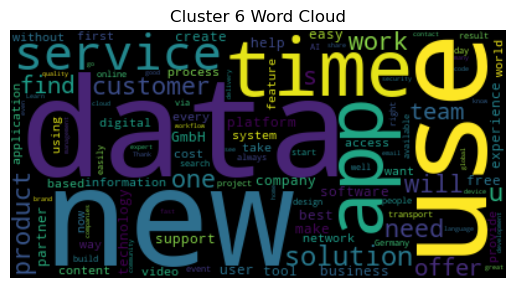

---------------------------------------------Cluster 7:---------------------------------------------
Kunveno - Work Happier WORK HAPPIER Boost culture and create high-performing teams with genuine appreciation Ready for new heights? Kunveno is your positivity hub to exchange appreciation of all stripes in the workplace, make it visible and anchor it firmly in the DNA of your corporate culture. A small place of longing with a big effect: For more resilience, more productivity and less fluctuation in hectic everyday work. Based on 1,000+ user reviews Leading companies rely on Kunveno CULTURE EATS STRATEGY FOR BREAKFAST Boost your corporate culture Whether manager or employee: With Kunveno, everyone in your company can send and receive positive feedback. Collect positive moments and make them tangible for everyone - whether in a team meeting, ad-hoc or as a live ticker. It only takes a few clicks to build a corporate culture together where everyone feels seen and valued. 👏 That's why Kunv

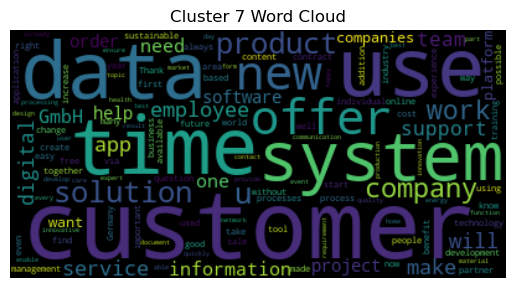

---------------------------------------------Cluster 8:---------------------------------------------
HOME | Givetastic.org top of pageWalletWalletWalletCareersMeet the Team MoreUse tab to navigate through the menu items.EmpowerYourEmployees.Bring Employee Social Responsibility to your organization for engaged employees and lasting positive impact.REMOTE ESCAPES Our Partners Learn More - How it Works How does it Work?1Create a Digital Wallet for your Employees ​Via our App, companies can create fully customizable "Giving Wallets" with a desired donation budgets for their employees. By creating equally sized coupons, the wallet budget is then divided among the employees. "The Givetastic App is a great fusion of emotional narrative and swarm intelligence functionality. Top !" Uwe Berger, CEO, BandB Markenagentur GmbHHow can You Create Lasting Positive Impact?By Giving Money Set up a digital wallet with an individual donation budget to your employees. Choose from over 200+ accredited proje

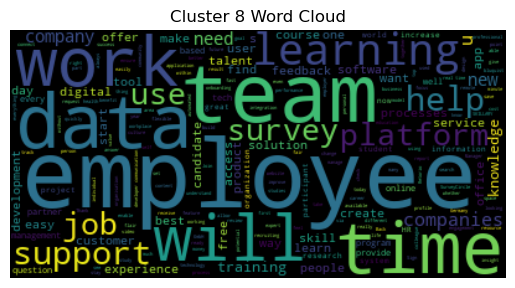

---------------------------------------------Cluster 9:---------------------------------------------
Simply electric car | Simply e-car e-cars wall boxes charging cards GHG quotas e-knowledge How it works Done Directly to the e-car Easily find your perfect complete e-car package 100% free of charge Our service is completely free of charge for you. We explain below how we make money. All-round carefree With our self-service assistants, you can find out which e-cars and wall boxes are right for you. Attractive offers With your free account, you will always receive cheap offers for wall boxes and e-cars first. From our offer This is how we support you 1. Discover the complete package Our assistant guides you through your complete package with simple questions: from the e-car to the subsidy program. Everything to do with your e-car Click on the circles to find out how we can support you Overjoyed to have become an e-car driver Jakob from Munich This is how the simple e-car is financed Our 

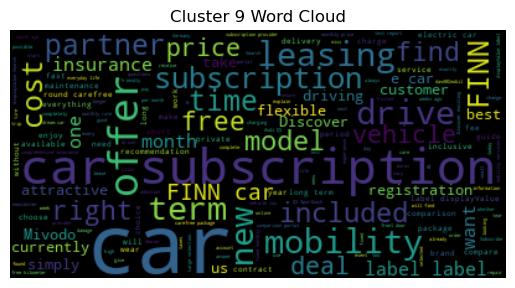

---------------------------------------------Cluster 10:---------------------------------------------
Cloud Ready Software GmbH - cloud-ready-software.com Take the Fast Lane to the Cloud Product Manager"We have compelling business cases and are thinking of bringing our IP to AppSource. We need to make all the right choices."The future is at your fingertips. We can show you the way.Head of IT"Microsoft AppSource and their power stack seems to be an ideal way of adding value to our products. We need to figure out how to get started and re-org."We lead you through the process. From red tape to execution.CEO"Technology is a means to an end. I want to focus on growing our business, increasing revenue and making our customers happy."Focus on your business. Leave technology to us.We bring people together Our Services Business AppsYou have the expertise to make a difference in an industry segment. We have the expertise to turn your know-how into an app. Or to migrate your app to the cloud.Powe

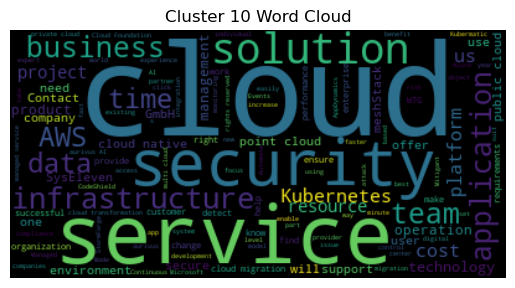

---------------------------------------------Cluster 11:---------------------------------------------
TIME TO TOKEN – | The NFT Collection | The NFT Collection Straight to the 3D exhibition On December 2, 2021, the Van Ham auction house auctioned off a hybrid NFT created by the Hanhart watch manufacturer. The NFT not only certifies the right to the digital drafts, designs and renderings, but also entitles the Hanhart CXD to be built as a one-off in the real world. The NFT started with an estimate of 10,000 euros, the hammer price was 30,000 euros. Together with buyer's premium and taxes, the price is 44,625 euros. More exciting things coming soon! Sign up to be informed immediately. We provide you with first-hand information. New NFTs, new drops, plans, intentions. Collectors aiming for the metaverse. Collapsing universes or expanding suns. All we need is your email address. I have read and agree to the privacy policy.*Subscribe Copyright ©2023 The NFT Collection | • eduardo pampinella

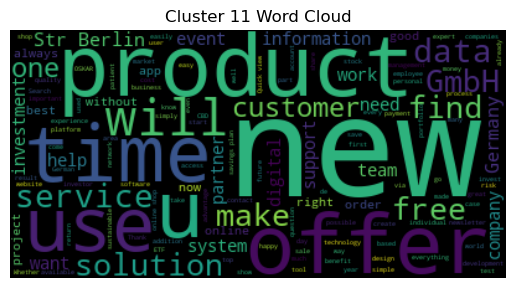

---------------------------------------------Cluster 12:---------------------------------------------
Studymaniac - study successfully Open main menu Your partner for successful studies High-quality courses that are precisely tailored to your university With Studymaniac, your next exam will be child's play🎉 All our courses are created by selected experts and are designed to give you time at Understanding the topics and preparing you ideally for the exam. Understand quickly Simple explanations Understand the complicated topic from the two-hour lecture in just a few minutes using short videos and scripts with detailed examples Learn everywhere Digital flashcards With our flashcard app, even memorizing "boring" topics is fun perfect preparation Interactive mock exams How well prepared you are already are easy to check with our interactive mock exams Coming soon Studies + practice = 🤝🏻 Through us you will come into contact with exciting companies during your studies. We find companies that

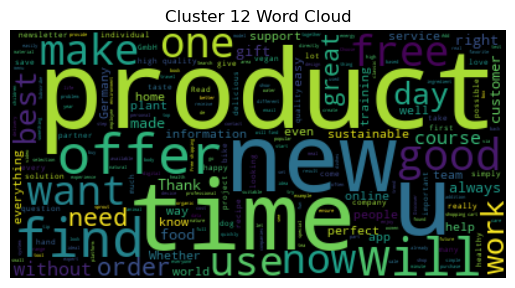

---------------------------------------------Cluster 13:---------------------------------------------
deepmello and friends leipzig - slow fashion and fine living Welcome to deepmello and friends shop shop women women men men bags bags accessories accessories interior interior about us about us shop women men bags accessories interior about us item was added to cart check out continue shopping slow fashion and fine livingWith deepmelloandfriends we present ourselves and friends with a common vision of honest, fair and sustainable products. Current collection Regular price €49.00 Regular price Retail price €49.00 Basic price / per Regular price €99.90 Regular price Retail price €99.90 EUR Basic price / per Sold out Regular price €169.90 Regular price Retail price € 169.90 EUR Base price / per Normal price €169.90 Normal price Retail price €169.90 Base price / per popular products Normal price €115.00 Normal price Retail price €115.00 EUR Base price / per Normal price €45, 00 EUR Normal 

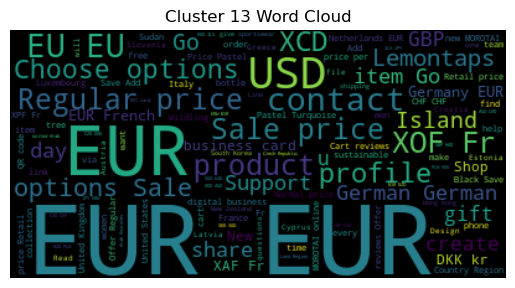

---------------------------------------------Cluster 14:---------------------------------------------
DEMECAN – Medizinisches Cannabis Made in Germany Menu Medical Cannabis Made in Germany Order medical cannabis Pharmacies can order directly from us. For more information visit our shop. We are hiring We offer great career opportunities at three different locations in Germany. Become a part of the DEMECAN team! Contact us If you have questions, we are here to help! Please find our contact details here. DEMECAN is the only independent German company that covers all manufacturing steps for medical cannabis – from cultivation, processing and storage until delivery to pharmacies all over Germany. Our mission For our patients in Germany, we ensure the reliable supply with medical cannabis of the highest pharmaceutical quality. We hope that the legalization of recreational cannabis will also facilitate the access to medical cannabis. From Berlin startup to Germany’s largest cannabis producer 

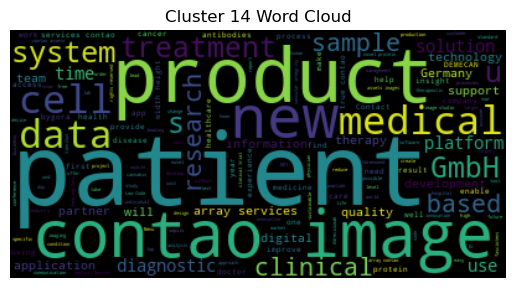

---------------------------------------------Cluster 15:---------------------------------------------
DER KLEINE GOURMET Free shipping in Germany from 40€ No additives Vegan Fast shipping with DHL Lovingly handcrafted My account Customer account or After registering, you can access your customer account here. Search Categories The little gourmet Payment and shipping Newsletter Subscribe to the newsletter now and always be informed about all spicy news! Subscribe now > I have taken note of them. social media | © 2023 THE LITTLE GOURMET . All rights reserved! * All prices incl. Value added tax plus cash on delivery fees, if not otherwise stated VALENTINE'S DAY SPECIAL! 10% discount with the code "LOVE"! Trusted Shops Reviews Toolkit: 1.1.5

Paul and Clara Secure DHL shipping and cheap small shipping by letter Designed with ♥ Questions? Search My Account or Search My Account or Categories Information Subscribe to our newsletter: Order I have taken note of the. follow us: email support Que

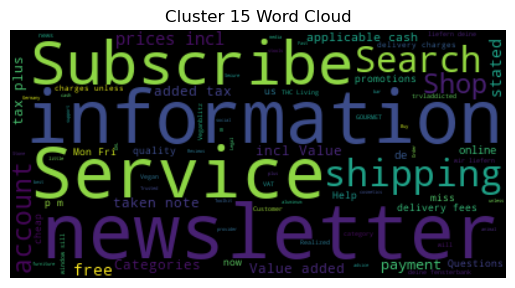

---------------------------------------------Cluster 16:---------------------------------------------
CrazyBunch - video game developer Toggle navigation Hi, we are CrazyBunch! CrazyBunch is a production and development company for video games and interactive media based in Hamburg, Germany. Games At CrazyBunch we love making games which we enjoy playing ourselves. Meet the Bunch Our team is a creative bunch of developers, game designers, and artists that have been working together successfully on many games for many years. We’re also fun to be around. Heiner CEO, Research and Development Barbar CEO, Technical Director Malte CEO, Creative Director Alice Art Director Caro Head of 3D Art Jo 2D Art and Animation Noody 2D Art and Animation Alara 2D Art and Animation Svenja Game Design and Writing Always bring a banana to a party! Get in touch For general enquiries, send us an email to . If you are press, feel free to check out our or drop us an email at .

Less Artificial - More Intelligen

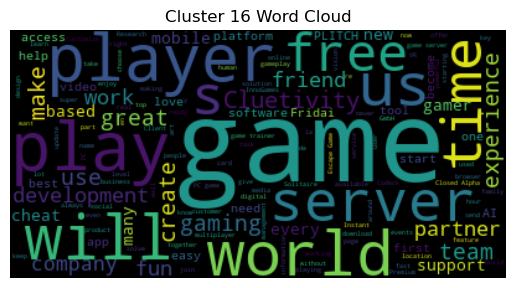

---------------------------------------------Cluster 17:---------------------------------------------
VEGDOG Vegan Premium Dog Food | developed by veterinarians. – VEGDOG SHOP ABOUT US ABOUT US Article in shopping cart! :-) Buy now Continue shopping VEGDOG - THE BEST VEGAN DOG FOODSave the world and feed your four-legged friend with our VEGDOG Highlights Regular price €15.90 Sales price €15.90 Base price (from €5.38 / per kg) Add to cart Savings tip! Normal price 4.29 € Selling price 4.29 € Base price ( from 30.10 € / per kg ) Add to cart Savings tip! Normal price 3.99 € Selling price 3.99 € Base price ( from 7.48 € / per kg ) Add to cart Savings tip! Normal price 13.90 € Selling price 13.90 € Base price ( from 4.50 € / per kg ) Add to cart Savings tip! Regular price €3.29 Sales price €3.29 Base price ( from €35.97 / per kg ) Add to cart Savings tip! Normal price €27.90 Sales price €27.90 Base price ( from / per ) Add to cart Savings tip! WHY VEGDOG VEGDOG• 100% VEGETABLE• DEVELOPED BY

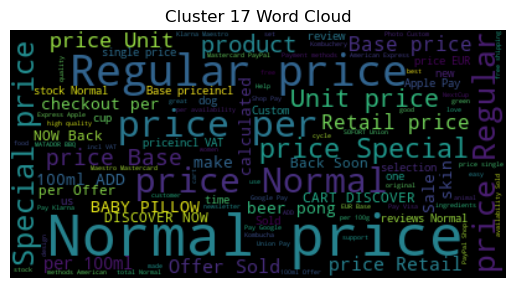

---------------------------------------------Cluster 18:---------------------------------------------
Spacewise | Your place for space FINALLY BOOK SPACE.Inexpensive garages, storage and parking spaces in your area.DON'T MISS OUTFIND SEARCH FOR RENTFind your perfect space exactly where you need it.BOOK Book directly via our clever system.USE Use your space exactly how you want it. Very uncomplicated. PEOPLE LOVE SPACEWISE "Because I don't own a car, my parking space has always been empty, although I have to pay for it. I've now found a tenant on Spacewise and I get the money directly into my account."Jana M. - private customer" I had to spontaneously put my furniture in between. Within a few minutes, I found a suitable basement, wrote to the landlord, booked, paid and stored the furniture. It couldn't be easier or safer."Luis L. - private customer"I knew I didn't even know before that I was allowed and able to rent out my basement and that I was getting so much money for it. It took me

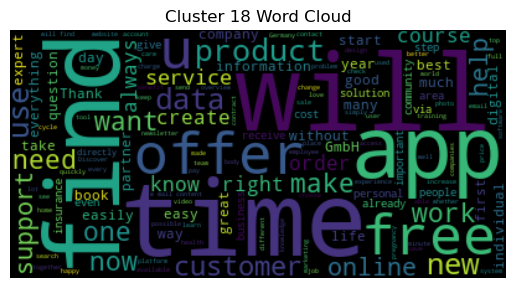

---------------------------------------------Cluster 19:---------------------------------------------
LEAP - Online Healthcare Education for Africa Online Healthcare Education for Africa Learn from top global institutions and industry experts to start or accelerate your career in healthcare Sign up for free 100% OnlineLearn at your own pace from anywhere AffordableEnjoy free and affordable courses CertifiedEarn a Certificate of Completion Choose a course \Learnworlds\Codeneurons\Pages\ZoneRenderers\CourseCards Learn from top universities and institutions "This program has enriched me a lot and I recommend it for all health professionals. It will set you above among your peers!"- Safiatou, learner from Ghana LEAP's Newsroom Blog Latest updatesSee our news, updates and health articles. Webinar Survey LEAP Health Series Are you or your business looking for new ways in which you can digitize your workflow? Take our survey so we can best tailor our health series webinar for you. Survey Star

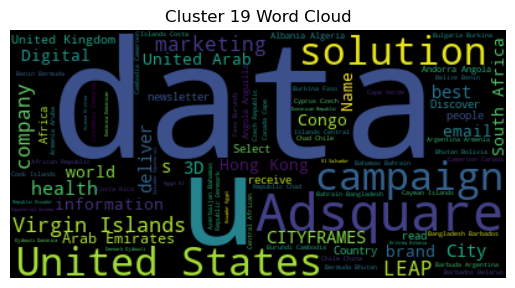

---------------------------------------------Cluster 20:---------------------------------------------
Highest savings rates in the European Union - Raisin You are visiting the website in the Netherlands. Please select another option if you live in another country. Netherlands Confirm Logout Logout Europe's largest savings intermediary Save with Raisin via one account at top interest rates of up to 4.05% per year at banks from the EU. The highest savings rates in Europe. More than 800,000 European savers preceded you. Save anywhere with the Raisin App Save anywhere with the Raisin App With the Raisin App you can easily open and manage your deposit and savings accounts in the EU on your smartphone or tablet. Scan the QR code and start saving! Why save with Raisin? Access top interest rates with easeRegister and identify yourself once within a few minutes. Then save at the bank(s) of your choice at top interest rates of up to 4.05% per year. Certainty With Raisin Online Banking you have s

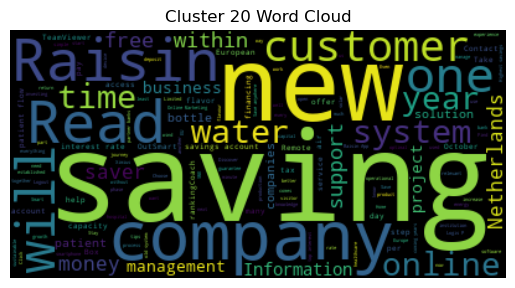

---------------------------------------------Cluster 21:---------------------------------------------
Stream and listen to music online for free with SoundCloud. | | |

Music licensing service for brands and agencies, artists and labels | Songtradr | Songtradr

onTrack – music city tours worldwide. discover the sound of your city Discover The Sound Of The City Get your digital guide for local music culture, launching soon for Android and iOS in Stuttgart onTRACK – the music city platform We connect local music history with their urban environment and tell the story of their culture in an interactive, mobile tour an your mobile phone. © 2019 Florian Müller Discover The Sound Of Your City How? With onTRACK. TOUR CONTENT Find personalized and diverse tours through the cities you’re exploring or living in. Discover all the exciting behind-the-scenes content to your favorite music connected to the city’s cultural history. Enjoy songs, videos and more multimedia content and feel the sound of

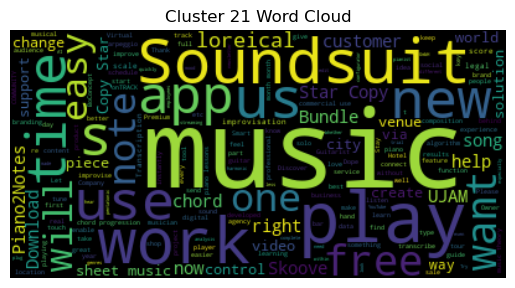

---------------------------------------------Cluster 22:---------------------------------------------
Leading Carbon Accounting, Sustainability and Decarbonisation Platform | Track and Reduce Your Carbon Footprint Products and ServicesSustainability journey stepsSustainability SolutionsIndividual offeringsCAse studiesCase StudiesCompanyAboutAboutResourcesDefinitionsCalculatorsThe sustainability platform for tomorrow’s climate leadersYour entire net-zero journey in one comprehensive platform. Measure, report, and reduce your emissions with the guidance of leading carbon accounting and decarbonisation experts.The Sustainability PlatformThe trusted sustainability solution for your net-zero journeyAs the global economy shifts to net-zero, we help you meet regulatory demands, create a comprehensive strategy, and boost your bottom line. Automate corporate carbon accounting, decarbonisation, and ESG reporting with Plan A's corporate sustainability solution. Trusted byThe opportunityGain a com

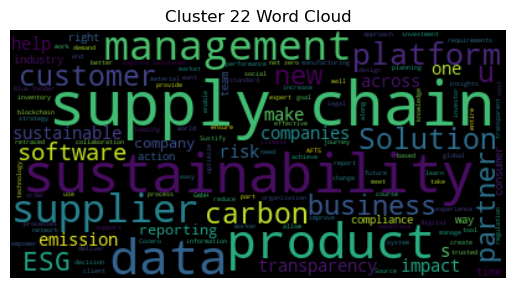

---------------------------------------------Cluster 23:---------------------------------------------
Aicone - Artificial Intelligence Cloud One | Advanced Analytics, Fuel Pricing Aicone UTILISES BIG DATA TO PROVIDE ADVANCED ANALYTICS ABOUT US We provide Advanced Analytics through Smart AI-based software and Machine Learning capable services that help you transform your data into decision making tools. One-Stop Partner Quality Assured Cost Effective We provide Advanced Analytics through Machine Learning capable services that help you transform your data into decision making tools. Over 10 years of experiences and continuous learning gives us the maturity to seamlessly integrate with our client’s processes. Dedicated teams working across time zones ensure that we complete your projects consistently in time and within budgets. Aicone automated systems and processes ensure Quality and Cost Effective turnarounds. Average cost savings of over 35-40%. WHAT WE DO FOR OUR CLIENTS? Predictive R

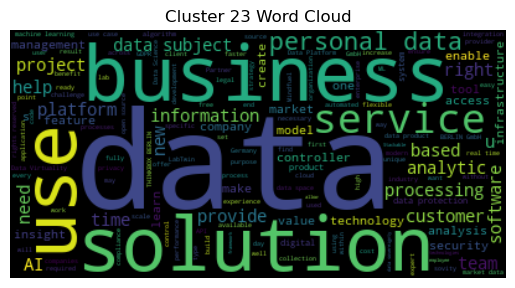

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Print texts for each cluster
for cluster in range(num_clusters):
    cluster_texts = df.loc[df['Cluster'] == cluster, 'website_text_in_en']
    print(f"---------------------------------------------Cluster {cluster}:---------------------------------------------")
    for text in cluster_texts:
        print(text)
        print()


    # Plot relevant words of the cluster
    cluster_text = ' '.join(cluster_texts)
    wordcloud = WordCloud().generate(cluster_text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Cluster {cluster} Word Cloud")
    plt.show()



Visualisierung der Cluster-Hierarchie: Sie können die hierarchische Struktur der Cluster mithilfe eines Dendrogramms darstellen. Ein Dendrogramm zeigt die Verbindungen zwischen den Clustern als Baumstruktur. Sie können die Methode linkage aus der scipy-Bibliothek verwenden, um die Verbindungen zwischen den Clustern zu berechnen, und dann die Methode dendrogram verwenden, um das Dendrogramm zu zeichnen. Hier ist ein Beispielcode:

In [15]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Berechne die Verbindungen zwischen den Clustern
linkage_matrix = linkage(tfidf_matrix.toarray(), method='ward')

# Zeichne das Dendrogramm
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=num_clusters)
plt.xlabel('Texte')
plt.ylabel('Distanz')
plt.title('Hierarchisches Clustering Dendrogramm')
plt.show()



Visualisierung der Cluster-Ähnlichkeiten: Sie können die Ähnlichkeiten zwischen den Clustern mithilfe einer Heatmap darstellen. Eine Heatmap zeigt die Ähnlichkeitswerte als Farbmatrix an. Sie können die Methode pairwise_distances aus der sklearn.metrics-Bibliothek verwenden, um die Ähnlichkeitsmatrix zwischen den Clustern zu berechnen, und dann die Methode imshow aus der matplotlib.pyplot-Bibliothek verwenden, um die Heatmap zu zeichnen. Hier ist ein Beispielcode:

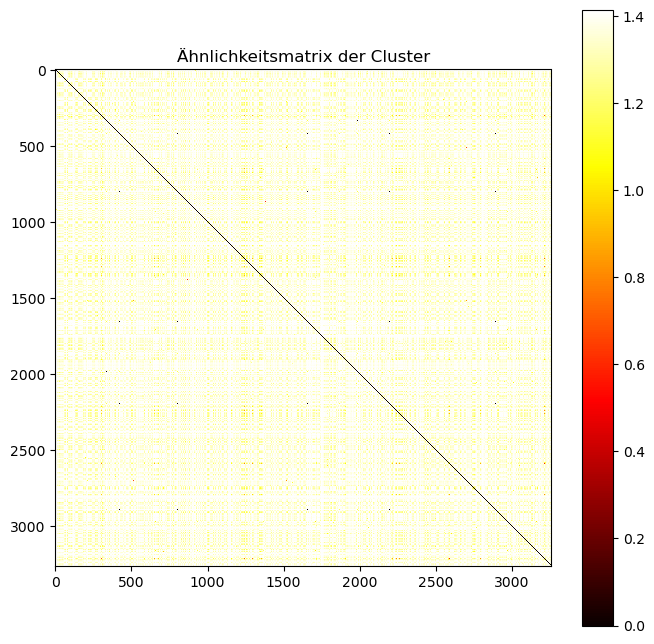

In [13]:
from sklearn.metrics import pairwise_distances
import numpy as np

# Berechne die Ähnlichkeitsmatrix zwischen den Clustern
cluster_distances = pairwise_distances(tfidf_matrix.toarray(), metric='euclidean')

# Zeichne die Heatmap
plt.figure(figsize=(8, 8))
plt.imshow(cluster_distances, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Ähnlichkeitsmatrix der Cluster')
plt.show()

Interpretation der Cluster: Betrachten Sie die Texte innerhalb jedes Clusters und versuchen Sie, gemeinsame Themen oder Charakteristika zu identifizieren. Lesen Sie einige der Texte in jedem Cluster, um ein Verständnis dafür zu entwickeln, welche Art von Inhalten oder Eigenschaften die Texte in einem Cluster teilen könnten. Sie können auch deskriptive Statistiken wie die Anzahl der Texte in jedem Cluster oder die durchschnittliche Ähnlichkeit zwischen den Texten in einem Cluster berechnen, um weitere Informationen über die Cluster zu gewinnen.